In [1]:
import scanpy as sc

In [2]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pylab as plt
from scipy import stats
import skimage.filters as skif
from sklearn.preprocessing import normalize
import glob
import os
import QCPipe
import dropkick as dk

In [3]:
sc.set_figure_params(dpi=200)

In [4]:
adata = sc.read_h5ad('Jeremy-Filtered-data/Jeremy-Combined-data-Cluster7Filtered_dropkick.h5ad')

In [5]:
adata.raw = adata

In [6]:
adata.var['Mitochondrial'] = adata.var.index.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata,qc_vars=['Mitochondrial'],use_raw=True,inplace=True)

In [7]:
sc.pp.normalize_total(adata) #Normalize data by the median counts per single cell library
adata.X = np.arcsinh(adata.X).copy() #Transform the data by using an inverse hyperbolic sine transform, this eliminates the need for adding a pseudocount 
sc.pp.scale(adata) #Scale and center the data for interpretability

In [8]:
adata.X

array([[ 0.        ,  0.        ,  0.        , ..., -0.01804807,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.01804807,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.01804807,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ..., -0.01804807,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.01804807,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.01804807,
         0.        ,  0.        ]], dtype=float32)

In [9]:
sc.pp.pca(adata,random_state=0)

In [10]:
neighborhood_k = np.sqrt(adata.n_obs).astype(int) #We have found that scaling the K to equal the square root of the total number of neighbors to be effective
sc.pp.neighbors(adata,n_neighbors=neighborhood_k,use_rep='X_pca',random_state=0) #Calculate this KNN based off of the PCA distances

OMP: Info #274: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [11]:
sc.tl.umap(adata,min_dist=0.25,random_state=0)

In [12]:
sc.tl.leiden(adata,resolution=2,random_state=0) #Here we use a resolution of 2, which should yield 30+ clusters. This step may take a while.

In [13]:
involved = ['GSM3972020','GSM3972017','GSM3972024','GSM3972028','GSM3972030','GSM3972013','GSM3972016','GSM3972009','GSM3972011','GSM3972022','GSM3972026']

In [14]:
adata.obs['involved'] = np.isin(adata.obs.batch,involved).astype(int)

In [15]:
adata.obs['involved'].value_counts()

1    2421
0     649
Name: involved, dtype: int64

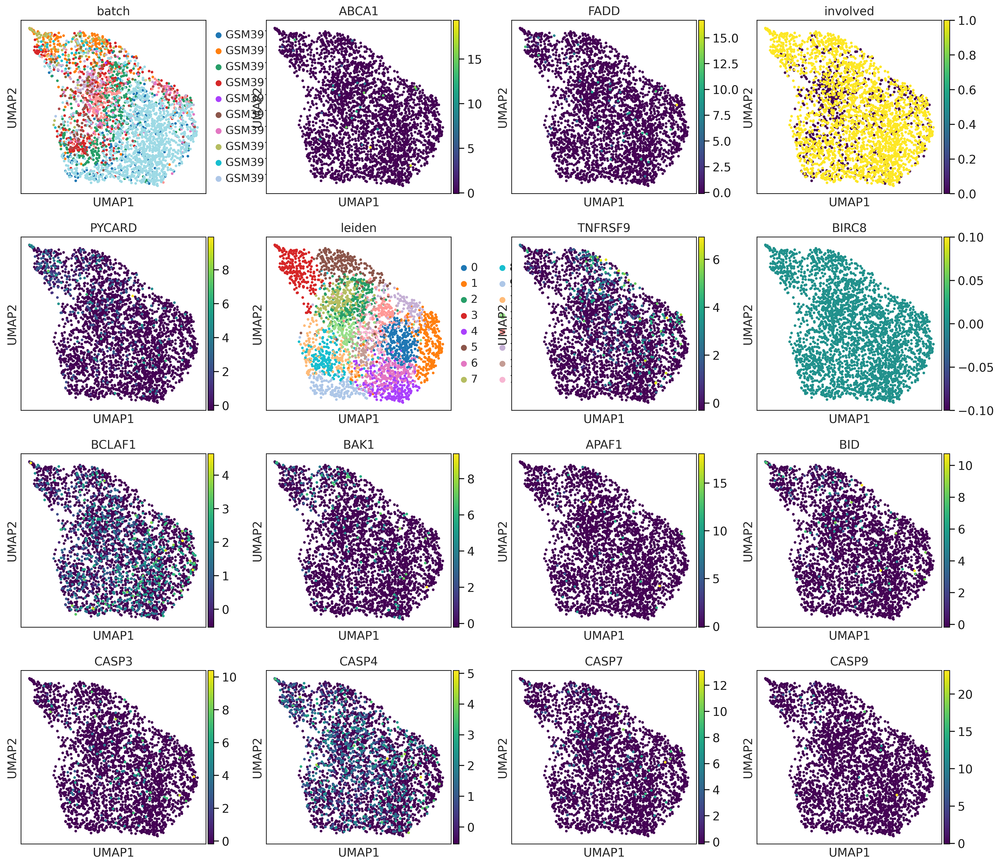

In [16]:
sc.pl.umap(adata,color=['batch','ABCA1','FADD','involved','PYCARD','leiden','TNFRSF9','BIRC8','BCLAF1','BAK1','APAF1','BID','CASP3','CASP4','CASP7','CASP9'],use_raw=False,cmap='viridis')

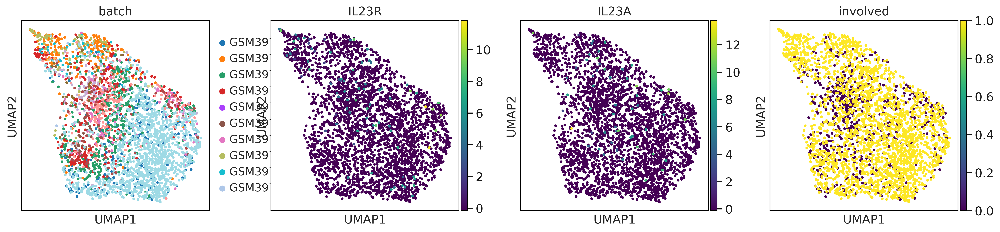

In [17]:
sc.pl.umap(adata,color=['batch','IL23R','IL23A','involved'],use_raw=False,cmap='viridis')

In [16]:
adata[:,'BCLAF1'].X.shape

(3070, 1)

In [19]:
adata.obs.involved = adata.obs.involved.astype(str)

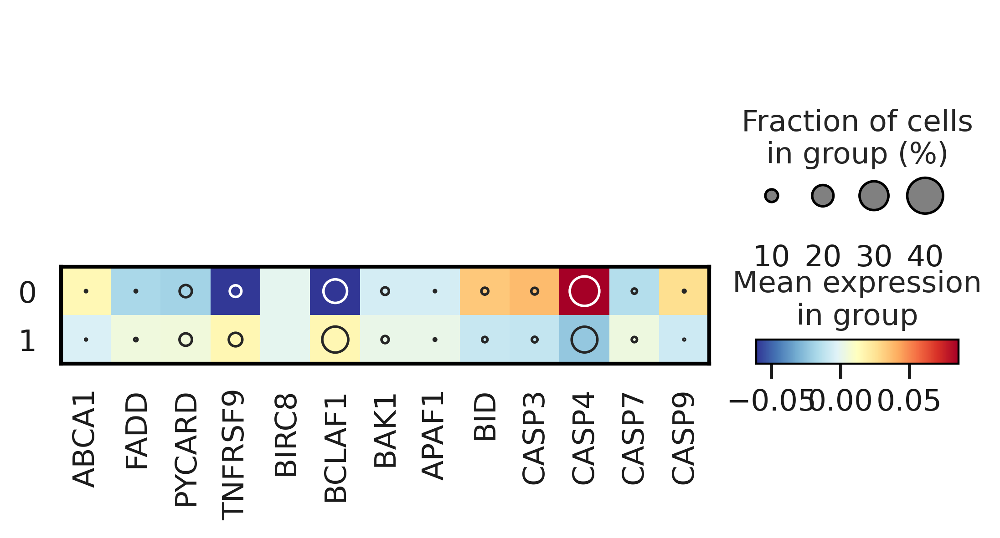

In [21]:
dp = sc.pl.dotplot(adata,var_names=['ABCA1','FADD','PYCARD','TNFRSF9','BIRC8','BCLAF1','BAK1','APAF1','BID','CASP3','CASP4','CASP7','CASP9'],groupby='involved',dendrogram=False,use_raw=False,var_group_rotation=0,swap_axes=False,return_fig=True,)
dp.style(cmap='RdYlBu_r',color_on='square',dot_edge_color=None,dot_edge_lw=1)
dp.savefig('JG_gene_heatmap.svg')

In [36]:
adata.obs['involved'].astype('category')

Cells
ACGTCAATCTTATCTG-1-GSM3972025    0
GACCAATCATGGATGG-1-GSM3972025    0
GCAATCATCGGCGGTT-1-GSM3972025    0
AAAGTAGAGAATTGTG-1-GSM3972025    0
CCTACACTCATCGCTC-1-GSM3972025    0
                                ..
GACGTTACATTGCGGC-1-GSM3972015    0
CCGTGGATCCCAAGAT-1-GSM3972015    0
CGTGTCTGTGCGGTAA-1-GSM3972015    0
CAAGTTGGTGTTCTTT-1-GSM3972015    0
CCTTCGAAGGGCTTCC-1-GSM3972015    0
Name: involved, Length: 3070, dtype: category
Categories (2, object): ['0', '1']

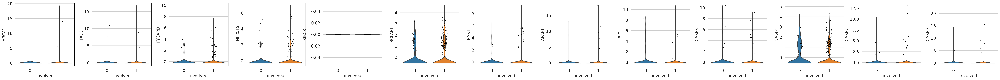

In [25]:
vp = sc.pl.violin(adata,keys=['ABCA1','FADD','PYCARD','TNFRSF9','BIRC8','BCLAF1','BAK1','APAF1','BID','CASP3','CASP4','CASP7','CASP9'],groupby='involved',use_raw=False)

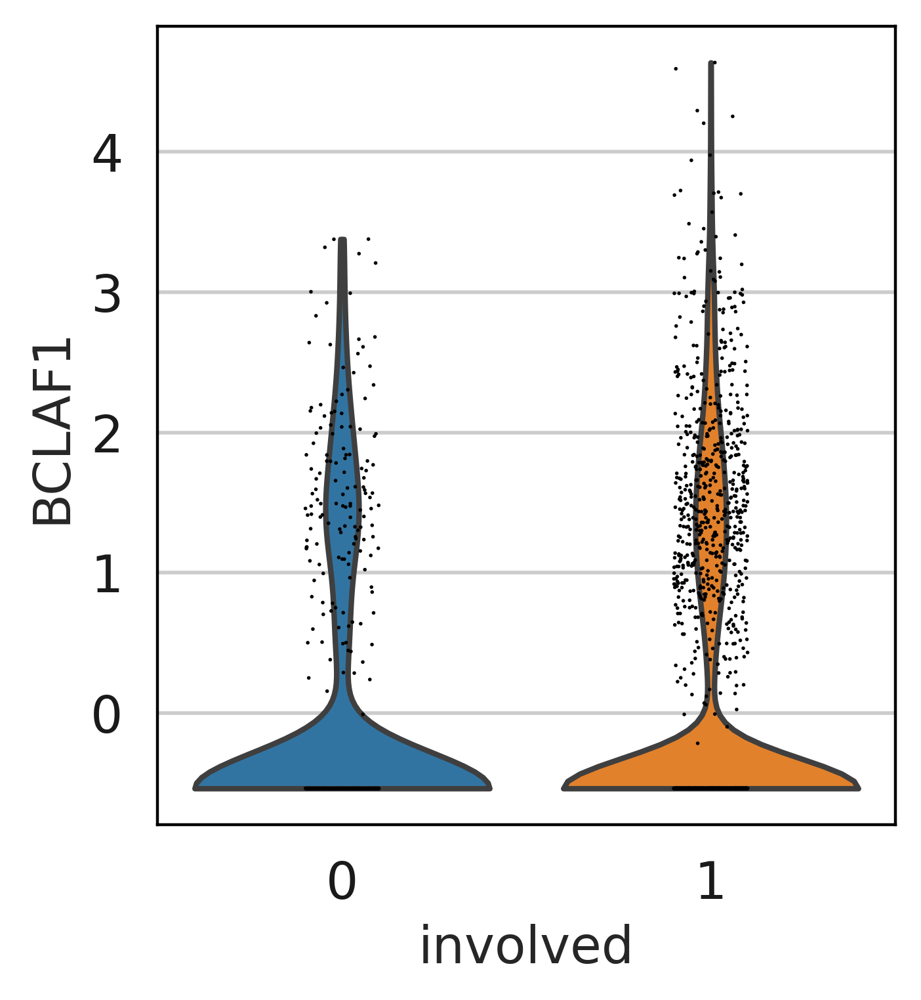

In [28]:
sc.pl.violin(adata,keys=['BCLAF1'],groupby='involved',use_raw=False,save='JG_BCLAF1.svg')

In [58]:
adata.obs['recode'] = 'uninvolved'
#adata.obs.recode[adata.obs.involved=='1'] = 'involved'

In [60]:
adata.obs['recode']

Cells
ACGTCAATCTTATCTG-1-GSM3972025    uninvolved
GACCAATCATGGATGG-1-GSM3972025    uninvolved
GCAATCATCGGCGGTT-1-GSM3972025    uninvolved
AAAGTAGAGAATTGTG-1-GSM3972025    uninvolved
CCTACACTCATCGCTC-1-GSM3972025    uninvolved
                                    ...    
GACGTTACATTGCGGC-1-GSM3972015    uninvolved
CCGTGGATCCCAAGAT-1-GSM3972015    uninvolved
CGTGTCTGTGCGGTAA-1-GSM3972015    uninvolved
CAAGTTGGTGTTCTTT-1-GSM3972015    uninvolved
CCTTCGAAGGGCTTCC-1-GSM3972015    uninvolved
Name: recode, Length: 3070, dtype: object

In [75]:
adata.obs['recode'][adata.obs.involved==1] = 'involved'

/tmp/ipykernel_1212810/476794477.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['recode'][adata.obs.involved==1] = 'involved'


In [40]:
involved = adata[adata.obs.involved=='1'].obs_vector("BCLAF1")

In [72]:
adata.obs['recode'].value_counts()

involved      2421
uninvolved     649
Name: recode, dtype: int64

In [41]:
df = pd.DataFrame(involved)

In [42]:
df.to_csv('Jeremy_Final_GeneFiles/JG_BCLAF1-involved.csv')

In [53]:
uninvolved = adata[adata.obs.involved=='0'].obs_vector("BCLAF1")

In [54]:
df = pd.DataFrame(uninvolved)

In [55]:
df.to_csv('Jeremy_Final_GeneFiles/JG_BCLAF1-uninvolved.csv')

In [62]:
df = pd.DataFrame({'involved':adata.obs.involved,'BCLAF1':adata[:,'BCLAF1'].X.reshape(3070,)})

In [74]:
df.to_csv('Jeremy_Final_GeneFiles/JG_BCLAF1.csv')

In [79]:
df = pd.DataFrame({'involved':adata.obs.involved,'CASP9':adata[:,'CASP9'].X.reshape(3070,)})

In [1]:
#df = df.set_index.remove_unused_levels(['involved'])['CASP9'].unstack().remove_unused_levels()

In [2]:
#df.pivot(index='involved', columns='CASP9').reset_index()

In [70]:
df.to_csv('Jeremy_Final_GeneFiles/JG_CASP9.csv')

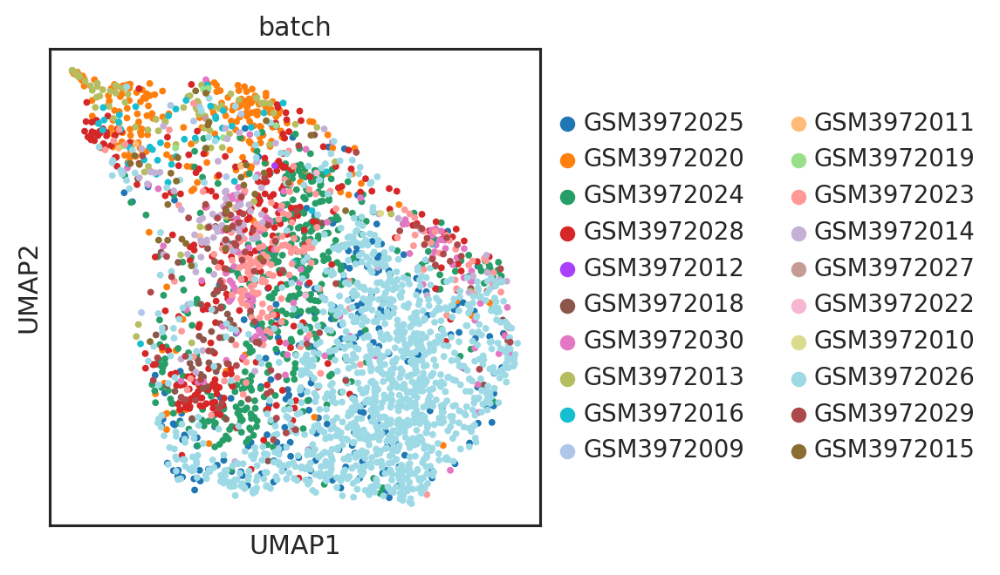

In [21]:
sc.pl.umap(adata,color=['batch'],use_raw=False,cmap='viridis')

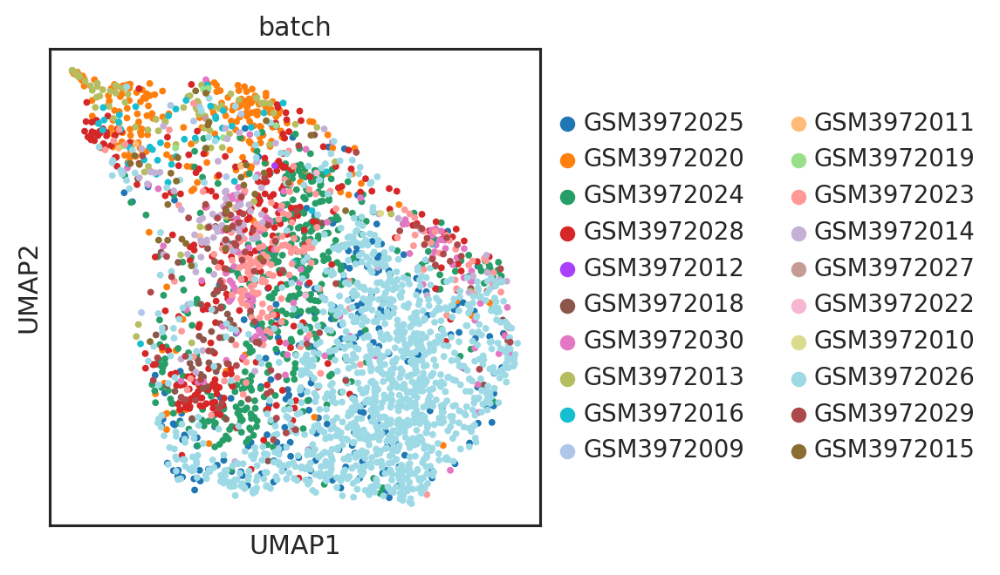

In [22]:
sc.pl.umap(adata,color=['batch'],use_raw=False,cmap='viridis')